MACHINE LERNING PIPLEINE BY: Okello Isaac Opio

Stuyd title: 

**GENETIC, BIOLOGICAL AND PSYCHOSOCIAL PREDICTORS OF INCIDENT AND PERSISTENT INTERNALIZING MENTAL DISORDERS AMONG UGANDAN CHILDREN AND ADOLESCENTS LIVING WITH HIV: A MACHINE LEARNING APPROACH**

**General Objective**

The general objective of this study is to investigate the predictors of Internalizing Mental Disorders among Ugandan children and adolescents living with HIV using a machine learning approach. 

**Specific Objectives**
- To build a machine learning model for prediction of prevalent, incident, and persistent cases of Internalizing Mental Disorders among Ugandan children and adolescents living with HIV.
- To evaluate the performance of the machine learning model (developed in 1 above) based on each of Genetic, Biological, and Psychosocial factors respectively.
- To evaluate the performance of the machine learning model based on the combination of all the three factor domains of Genetic, Biological, and Psychosocial factors. 


**STEPS**

The project roadmap
1. Prepare Problem
a) Load libraries
b) Load dataset

2. Summarize Data
a) Descriptive statistics
b) Data visualizations

3. Prepare Data
a) Data Cleaning
b) Feature Selection
c) Data Transforms

4. Evaluate Algorithms
a) Split-out validation dataset
b) Test options and evaluation metric
c) Spot Check Algorithms
d) Compare Algorithms

5. Improve Accuracy
a) Algorithm Tuning

6. Finalize Model
a) Predictions on validation dataset
b) Create standalone model on entire training dataset

7. Feature importance selection

In [119]:
# IMD Python Project Pipeline
# Load libraries
#import the necessary libraries

import pandas as pd # For the manipulation of tabular data
import numpy as np # For improved numerical calculation
from ydata_profiling import ProfileReport # For exploratory data analysis reporting
import matplotlib.pyplot as plt # For plotting
import seaborn as sns # For improved plot outlook
import pandas_profiling


%matplotlib inline 
#Tells Jupyter to display any matplotlib plots directly within the notebook, rather than in a separate. Alt: plt.show()

# Importing the scaler
from sklearn.preprocessing import StandardScaler

# Importing required models and metrics
# Importing necessary modules for cross-validation
from sklearn.model_selection import StratifiedKFold, cross_val_score

# Importing classifiers based on their functionalities

# Logistic Regression: A linear model for classification tasks, often used for binary classification
from sklearn.linear_model import LogisticRegression  
# Gaussian Naive Bayes: A probabilistic classifier based on Bayes' theorem with Gaussian distribution assumption
from sklearn.naive_bayes import GaussianNB  
# K-Nearest Neighbors: A non-parametric method used for classification based on nearest training examples
from sklearn.neighbors import KNeighborsClassifier  
# Decision Tree: A non-linear model that partitions the feature space into regions to make predictions
from sklearn.tree import DecisionTreeClassifier  
# Support Vector Classifier: A powerful classifier that finds the hyperplane that best separates classes in high-dimensional space
from sklearn.svm import SVC  

# Importing ensemble classifiers
# Random Forest: An ensemble method that builds multiple decision trees and combines their predictions
from sklearn.ensemble import RandomForestClassifier  
# Gradient Boosting Classifier: An ensemble method that builds trees sequentially, each correcting the mistakes of the previous one
from sklearn.ensemble import GradientBoostingClassifier  
# AdaBoost Classifier: An ensemble method that combines multiple weak learners to build a strong classifier
from sklearn.ensemble import AdaBoostClassifier  

# Removing the warnings from the cells by importing the warnings module

import warnings
warnings.filterwarnings('ignore')  # Setting up a filter to ignore warnings. Good if you are confident with the codes

In [120]:
# b) Load dataset
IMD_Data = pd.read_stata("DATASET25MARCH2024.dta")
IMD_Data.head(5)

,PatientID,agecatak,sex1,religion1,childeduc1,heightst1,weightst1,childtrib1,orphanhood,ses,...,IMDs,Rs10482605,Rs1360780,rs1386494,rs1843809,rs34517220,stin2vntr_new,httlpr1_new,HTTLPRrs35531_new,rs35531_new
0,CHAKA/01/01/0001,9-12,Female,Born Again,Pre-primary,134.0,31.0,Non-Munganda but Ugandan,Single parent alive,8.0,...,Yes,Yes,Yes,Yes,Yes,Yes,No,Yes,No,No
1,CHAKA/01/01/0002,13-17,Male,Protestant,Pre-primary,137.0,35.0,Non-Munganda but Ugandan,Single parent alive,3.0,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
2,CHAKA/01/01/0003,9-12,Female,Muslim,Pre-primary,120.1,19.0,Muganda,Both parents alive,7.0,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
3,CHAKA/01/02/0152,5-8,Female,Catholic,Pre-primary,99.0,15.0,Non-Munganda but Ugandan,NaN,5.0,...,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
4,CHAKA/01/02/0153,9-12,Female,Muslim,Pre-primary,131.6,30.0,Muganda,Both parents alive,6.0,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes


In [121]:
# List variable names
variable_names = IMD_Data.columns.tolist()

# Print the variable names
print(variable_names)

['PatientID', 'agecatak', 'sex1', 'religion1', 'childeduc1', 'heightst1', 'weightst1', 'childtrib1', 'orphanhood', 'ses', 'ses_cat', 'livelihood1', 'childartk1', 'childworst1', 'childpremt1', 'chilborhiv', 'Stress', 'chronic', 'recent3', 'stress_category', 'GroupCategory', 'cd4takeoff1', 'CD4_category', 'Viralload', 'Viralload_Category', 'tlbase', 'tl12', 'tldiff', 'stin2vntr_', 'httlpr1', 'HTTLPRrs35531', 'rs35531', 'Rs10482605_new', 'Rs1360780_new', 'rs1386494_new', 'rs1843809_new', 'rs34517220_new', 'IMDs', 'Rs10482605', 'Rs1360780', 'rs1386494', 'rs1843809', 'rs34517220', 'stin2vntr_new', 'httlpr1_new', 'HTTLPRrs35531_new', 'rs35531_new']


In [122]:
#Dropping Non-Important and Redundant Variables 
# List of variables to drop

columns_to_drop = ['PatientID', 'ses', 'Stress', 'chronic', 'recent3', 'GroupCategory', 'cd4takeoff1', 'Viralload','stin2vntr_', 'httlpr1', 'HTTLPRrs35531', 'rs35531', 'Rs10482605_new', 'Rs1360780_new', 'rs1386494_new', 'rs1843809_new', 'rs34517220_new']

# Dropping the specified columns
IMD_Dataset = IMD_Data.drop(columns=columns_to_drop)

**Summarize Data**

Descriptive statistics

Data visualizations

In [123]:
# 2. Summarize Data
# a) Descriptive statistics
IMD_Dataset.dtypes

agecatak                object
sex1                  category
religion1             category
childeduc1            category
heightst1              float64
weightst1              float64
childtrib1            category
orphanhood            category
ses_cat                 object
livelihood1           category
childartk1            category
childworst1           category
childpremt1           category
chilborhiv            category
stress_category        float32
CD4_category          category
Viralload_Category    category
tlbase                 float64
tl12                   float64
tldiff                 float32
IMDs                  category
Rs10482605              object
Rs1360780               object
rs1386494               object
rs1843809               object
rs34517220              object
stin2vntr_new           object
httlpr1_new             object
HTTLPRrs35531_new       object
rs35531_new             object
dtype: object

In [124]:
IMD_Dataset.shape

(736, 30)

In [125]:
IMD_Dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
heightst1,733.0,131.050887,22.690718,12.500000,119.000000,130.600000,144.000000,427.200000
weightst1,736.0,29.878111,11.915348,10.000000,21.000000,27.000000,36.000000,153.000000
stress_category,736.0,1.648098,0.531789,1.000000,1.000000,2.000000,2.000000,3.000000
tlbase,613.0,1.147457,0.362307,0.019943,0.914130,1.133582,1.358633,2.179359
tl12,552.0,0.904827,0.307347,0.191179,0.716800,0.849872,1.023283,2.189877
tldiff,465.0,0.244956,0.444415,-1.233903,0.011512,0.249710,0.517384,1.496646


In [126]:
# Checking for duplicates
IMD_Dataset.duplicated().sum()


0

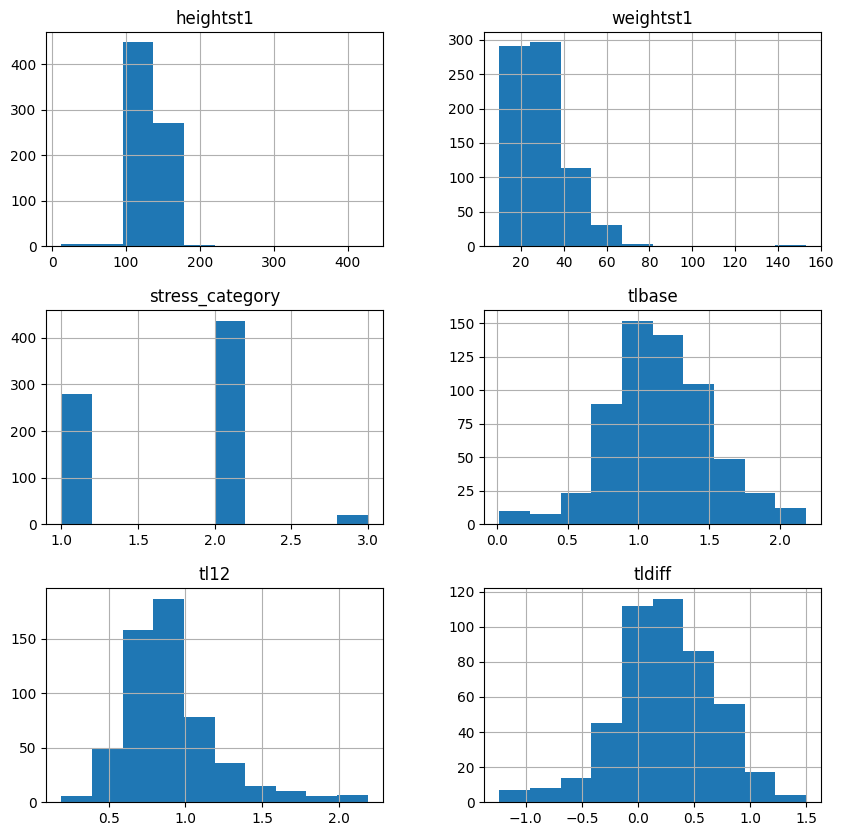

In [127]:
# b) Data visualizations
#Visualize the distribution of data in the dataset and identify any potential outliers or skewness in the data.
IMD_Dataset.hist(figsize=(10,10));

In [128]:
# 3. Prepare Data
# a) Data Cleaning
# b) Feature Selection
# c) Data Transforms



In [130]:
# create a copy of the original dataset with a new name
IMD_Copy = IMD_Dataset.copy()

# create an EDA report using pandasprofiling
profile = IMD_Copy.profile_report()

#Saving the profile report
profile.to_file("IMD_Profile_Report.html")

# Display the profile report
display(profile)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### Observations from pandas profiling
- `General Statistics:` There were about 30 variables. with 736 observations. The missing cells composed of 3.4%. There were no duplicates.
- `Presence of categorical data:` There were 15 variables that were tagged as categorical data and this informed our decision to perform label encoding on them as machine learning algorithms only work on non-categorical data.
- `Presence of a variables that were in ranges greater than [0,1]:` There was a total of three variables with a range greater than [0,1] and this informed our decision to carry out minmax scaling during data transformation to normalise those variables. Some of the variables included: height1, weight1, and tlbase. 
- `Presence of a highly imbalanced variable:` There were over 15 varaibles that were imbalanced and this informed our decision on the metrcs for selcetion of best model

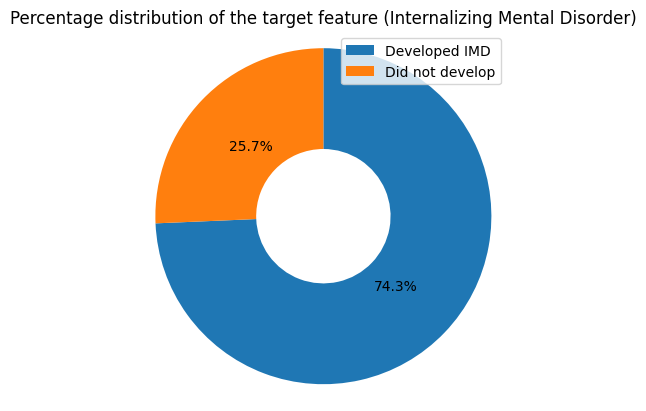

In [131]:
# Proportion of fetal health classes
plt.pie(IMD_Copy['IMDs'].value_counts(), startangle = 90, counterclock = False, autopct='%1.1f%%', wedgeprops = {'width' : 0.6});
plt.axis('square')
plt.legend(['Developed IMD','Did not develop'])
plt.title("Percentage distribution of the target feature (Internalizing Mental Disorder)");

MISSING VALUE IMPUTATIONS

In [132]:
# Missing Values before Imputations
IMD_Copy.isnull().sum()

agecatak                0
sex1                    1
religion1               1
childeduc1              3
heightst1               3
weightst1               0
childtrib1              1
orphanhood             18
ses_cat                 0
livelihood1             7
childartk1              0
childworst1             0
childpremt1             2
chilborhiv              1
stress_category         0
CD4_category            4
Viralload_Category    125
tlbase                123
tl12                  184
tldiff                271
IMDs                    0
Rs10482605              0
Rs1360780               0
rs1386494               0
rs1843809               0
rs34517220              0
stin2vntr_new           0
httlpr1_new             0
HTTLPRrs35531_new       0
rs35531_new             0
dtype: int64

**IMPUTATIONS**

In [133]:

# Impute missing values in numerical variables with mean
numerical_columns = IMD_Copy.select_dtypes(include=['float64', 'int64']).columns
IMD_Copy[numerical_columns]= IMD_Copy[numerical_columns].fillna(IMD_Copy[numerical_columns].mean())

# Impute missing values in categorical variables with mode
categorical_columns = IMD_Copy.select_dtypes(include=['object', 'category']).columns
IMD_Copy[categorical_columns] = IMD_Copy[categorical_columns].fillna(IMD_Copy[categorical_columns].mode().iloc[0])

# Check if all missing values are imputed
print("Missing Values after Imputation:")
print(IMD_Copy.isnull().sum())

Missing Values after Imputation:
agecatak                0
sex1                    0
religion1               0
childeduc1              0
heightst1               0
weightst1               0
childtrib1              0
orphanhood              0
ses_cat                 0
livelihood1             0
childartk1              0
childworst1             0
childpremt1             0
chilborhiv              0
stress_category         0
CD4_category            0
Viralload_Category      0
tlbase                  0
tl12                    0
tldiff                271
IMDs                    0
Rs10482605              0
Rs1360780               0
rs1386494               0
rs1843809               0
rs34517220              0
stin2vntr_new           0
httlpr1_new             0
HTTLPRrs35531_new       0
rs35531_new             0
dtype: int64


### Scaling
Ploting the data before rescaling

<Axes: >

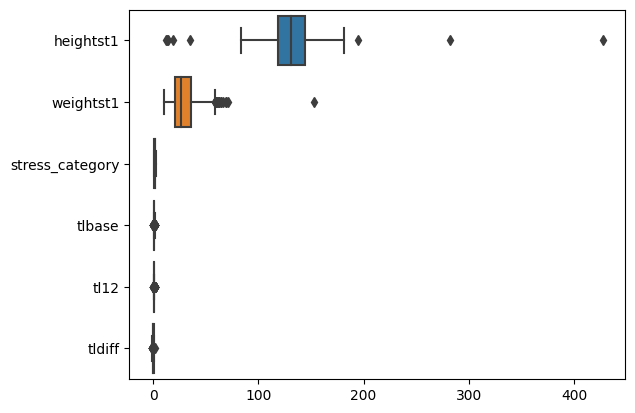

In [134]:
sns.boxplot(IMD_Copy, orient = 'h')

<Axes: >

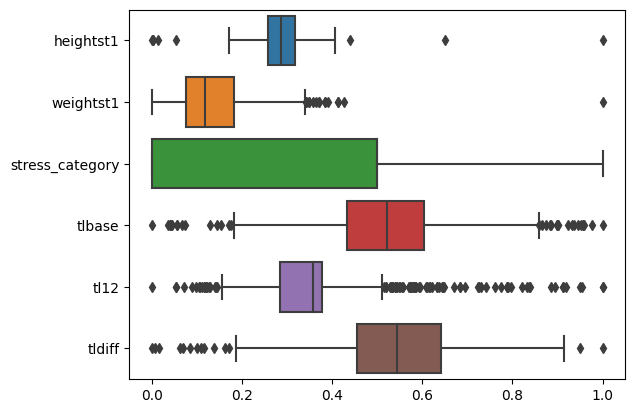

In [135]:
# MinMax Scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
IMD_Copy[['heightst1', 'weightst1','tlbase','stress_category', 'tl12', 'tldiff']] = scaler.fit_transform(IMD_Copy[['heightst1', 'weightst1','tlbase', 'stress_category', 'tl12', 'tldiff']])
#print(IMD_Copy.head(5))
sns.boxplot(IMD_Copy, orient = 'h')

*Droping tldiff*

I had to drop this becuase it failed to imput misisng values, eeven after trying to trasnfom. presence of missing values was affecting model training. 

In [136]:
# Drop the original 'tldiff' column
IMD_Copy.drop(columns=['tldiff'], inplace=True)


In [137]:
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import Normalizer, OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

In [138]:
# Label encode the IMD_Copy variable if it's categorical
for column in IMD_Copy.columns:
    if IMD_Copy[column].dtype == 'object' or IMD_Copy[column].dtype.name == 'category':
        label_encoder = LabelEncoder()
        IMD_Copy[column] = label_encoder.fit_transform(IMD_Copy[column])
IMD_Copy.head(5)

,agecatak,sex1,religion1,childeduc1,heightst1,weightst1,childtrib1,orphanhood,ses_cat,livelihood1,...,IMDs,Rs10482605,Rs1360780,rs1386494,rs1843809,rs34517220,stin2vntr_new,httlpr1_new,HTTLPRrs35531_new,rs35531_new
0,2,0,0,1,0.292983,0.146853,1,2,0,0,...,1,1,1,1,1,1,0,1,0,0
1,0,1,4,1,0.300217,0.174825,1,2,1,1,...,1,1,1,1,1,1,1,1,1,1
2,2,0,2,1,0.259465,0.062937,0,0,0,1,...,1,1,1,1,1,1,1,1,1,1
3,1,0,1,1,0.208585,0.034965,1,0,0,0,...,0,1,1,1,1,1,1,1,1,1
4,2,0,2,1,0.287196,0.139860,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1


In [139]:
# create an EDA report using pandasprofiling
profile3 = IMD_Copy.profile_report()

#Saving the profile report
profile3.to_file("Profile_Transformed_Imputed.html")

# Display the profile report
display(profile3)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [140]:
# Since IMD_Copy contains both features and the target variable
# Separate features and target variable
features = IMD_Copy.drop('IMDs', axis=1)
target = IMD_Copy['IMDs']

In [141]:
# 4. Evaluate Algorithms
# a) Split-out validation dataset
# b) Test options and evaluation metric
# c) Spot Check Algorithms
# d) Compare Algorithms



**Model Spot-checking**

The following classifiers have been used in the model spot-checking
- Dummy Classifier - Not Included to check for accuracy given only most frequent class is always predicted as target. Taken as lower baseline classifier.
- Logistic Regression
- Naive Bayes
- K-Nearest Neighbours
- Support Vector Machines - Support Vector Classifier
- Decision Trees
- Ensemble classifiers (Random Forests, Gradient Boosting Classifier and AdaBoostClassifier)

The chosen evaluation metric was `f1-score`. However, other metrics `precision`, `recall`, `roc_auc` were also employed to do model spot checking.

The **`_weighted`** versions of the metrics have been used to cater for `target imbalances` in the data. For `roc_auc`, the **`_ovo` (one versus one (ovo))** was used to cater for `imbalances` in the data too. The ovo is insensitive to data label imbalances unlike the `one versus rest` version.

The `StratifiedKFold` was used in `cross validation` to ensure each `split` contains equivalent proportions of the different `classes` in the data.

At first, the `DummyClassifier` was used to set a `baseline score` given one choses the target value at random or selects the most frequent class.

In [142]:
# from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Instantiating the models
# dc = DummyClassifier(strategy='most_frequent')
lr = LogisticRegression()
nb = GaussianNB()
knn = KNeighborsClassifier()
dt = DecisionTreeClassifier()
sv = SVC(probability=True)  # Probability set to True to return a non-NaN roc_auc
rf = RandomForestClassifier()
gb = GradientBoostingClassifier()
ad = AdaBoostClassifier()
lda = LinearDiscriminantAnalysis()

from sklearn.model_selection import StratifiedKFold

# Setting the StratifiedKFold parameter
skfold = StratifiedKFold(n_splits=10, random_state=42, shuffle=True)
# ^ This creates a StratifiedKFold object with 10 splits, ensuring that each fold has approximately the same class distribution as the original dataset.
#   `random_state=42` ensures reproducibility of results, while `shuffle=True` shuffles the data before splitting into folds.

In [160]:
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
import warnings
# Suppress warnings
warnings.filterwarnings("ignore")

# Define models and scores as you did
models = [lr, nb, knn, dt, sv, rf, gb, ad, lda]
scores = ["f1_weighted", "precision_weighted", "recall_weighted", "accuracy", "roc_auc_ovo_weighted"]

# Initialize lists to store scores for each model
f1 = []
precision = []
recall = []
accuracy = []
roc_auc = []
score_lists = [f1, precision, recall, accuracy, roc_auc]

# Define the number of folds for cross-validation
n_splits = 10  # You can adjust this number as needed

# Split the data into training and testing sets
# Assuming features and target are already defined
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Initialize StratifiedKFold for cross-validation
skfold = StratifiedKFold(n_splits=n_splits, random_state=42, shuffle=True)

# For loop to evaluate the models
for model in models:
    print(model)
    for index, score in enumerate(scores):
        cv_scores = cross_val_score(model, X_train, y_train, cv=skfold, scoring=score)
        score_lists[index].append(np.mean(cv_scores))
        print(score + " : " + str(np.mean(cv_scores)))
    print("\n")


LogisticRegression()
f1_weighted : 0.6727903818094053
precision_weighted : 0.6896286495570327
recall_weighted : 0.7228521332554061
accuracy : 0.7228521332554061
roc_auc_ovo_weighted : 0.6860951648101101


GaussianNB()
f1_weighted : 0.5669994012755527
precision_weighted : 0.693434586050315
recall_weighted : 0.5491817650496784
accuracy : 0.5491817650496784
roc_auc_ovo_weighted : 0.638171983909843


KNeighborsClassifier()
f1_weighted : 0.6231749358751225
precision_weighted : 0.6051264389756535
recall_weighted : 0.6616014026884862
accuracy : 0.6616014026884862
roc_auc_ovo_weighted : 0.5230045070353724


DecisionTreeClassifier()
f1_weighted : 0.6323905295384449
precision_weighted : 0.6376833782146021
recall_weighted : 0.641437755698422
accuracy : 0.6328462887200468
roc_auc_ovo_weighted : 0.5473515569018305


SVC(probability=True)
f1_weighted : 0.604269376007632
precision_weighted : 0.5200432037891444
recall_weighted : 0.7210987726475746
accuracy : 0.7210987726475746
roc_auc_ovo_weighted : 0

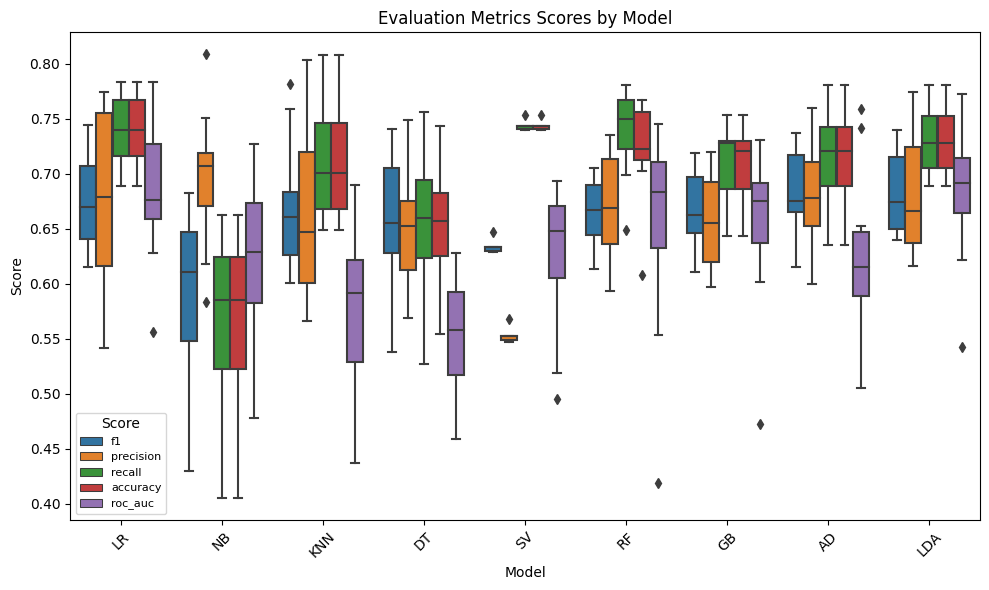

In [166]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Convert scores lists to a DataFrame
data = pd.DataFrame({
    'Model': ['LR', 'NB', 'KNN', 'DT', 'SV', 'RF', 'GB', 'AD', 'LDA'],
    'f1_weighted': f1,
    'precision_weighted': precision,
    'recall_weighted': recall,
    'accuracy': accuracy,
    'roc_auc_ovo_weighted': roc_auc
})

# Melt the DataFrame to reshape it for plotting
melted_data = pd.melt(data, id_vars='Model', var_name='Metric', value_name='Score')

# Modify the variable names according to your new data structure
plt.figure(figsize=(10, 6))
sns.boxplot(x="Model", y="value", hue="Score", data=melted_df) 
plt.title("Evaluation Metrics Scores by Model", fontsize=12)
plt.xlabel("Model", fontsize=10)
plt.ylabel("Score", fontsize=10)
plt.xticks(rotation=45)
plt.legend(title="Score", fontsize=8)
plt.tight_layout()
plt.show()


Logistic regression was chosen as the best model

### Improving Accuracy

#### Hyperparameter tuning
Hyperparameter tuning is used to optimize the performance of machine learning models by searching for the best set of hyperparameters. Hyperparameters are settings that are not learned from the data but are set prior to training, such as the regularization strength in logistic regression, the depth of a decision tree, or the number of trees in a random forest.

Hyperparameter tuning is typically performed after selecting a model and before evaluating its performance on unseen data (e.g., a holdout test set). Here's a breakdown of the typical workflow involving hyperparameter tuning:

In [173]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Define the grid of hyperparameters for each model
# param_grid_dc = {}  # DummyClassifier does not have hyperparameters
param_grid_lr = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}
param_grid_nb = {}  # GaussianNB does not have hyperparameters
param_grid_knn = {'n_neighbors': [3, 5, 7, 9]}
param_grid_dt = {'max_depth': [None, 5, 10, 20]}
param_grid_sv = {'C': [0.1, 1, 10], 'gamma': [0.1, 1, 10]}
param_grid_rf = {'n_estimators': [50, 100, 200], 'max_depth': [None, 10, 20]}
param_grid_gb = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}
param_grid_ad = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}
param_grid_lda = {}  # LinearDiscriminantAnalysis does not have hyperparameters

# Define models to tune
models_to_tune = {'Logistic Regression': (lr, param_grid_lr),
                  'Gaussian Naive Bayes': (nb, param_grid_nb),
                  'K-Nearest Neighbors': (knn, param_grid_knn),
                  'Decision Tree': (dt, param_grid_dt),
                  'Support Vector Classifier': (sv, param_grid_sv),
                  'Random Forest': (rf, param_grid_rf),
                  'Gradient Boosting': (gb, param_grid_gb),
                  'AdaBoost': (ad, param_grid_ad),
                  'Linear Discriminant Analysis': (lda, param_grid_lda)}

# Perform grid search for each model
best_models = {}
for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_

# Validate performance on the test set
results = {}
for name, model in best_models.items():
    y_pred = model.predict(X_test)
    classification_rep = classification_report(y_test, y_pred)
    results[name] = classification_rep

# Print classification reports for each model on the test set
for name, report in results.items():
    print(f"Classification Report for {name}:\n{report}")

# Final Model Selection based on validation results
best_model_name = max(results, key=lambda key: results[key])
best_model = best_models[best_model_name]
print(f"\nBest Model Selected: {best_model_name}")

# You can now use 'best_model' for making predictions on new data


Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.29      0.20      0.24        25
           1       0.85      0.90      0.87       123

    accuracy                           0.78       148
   macro avg       0.57      0.55      0.56       148
weighted avg       0.75      0.78      0.77       148

Classification Report for Gaussian Naive Bayes:
              precision    recall  f1-score   support

           0       0.22      0.76      0.34        25
           1       0.90      0.44      0.59       123

    accuracy                           0.49       148
   macro avg       0.56      0.60      0.46       148
weighted avg       0.78      0.49      0.55       148

Classification Report for K-Nearest Neighbors:
              precision    recall  f1-score   support

           0       0.36      0.20      0.26        25
           1       0.85      0.93      0.89       123

    accuracy                           0

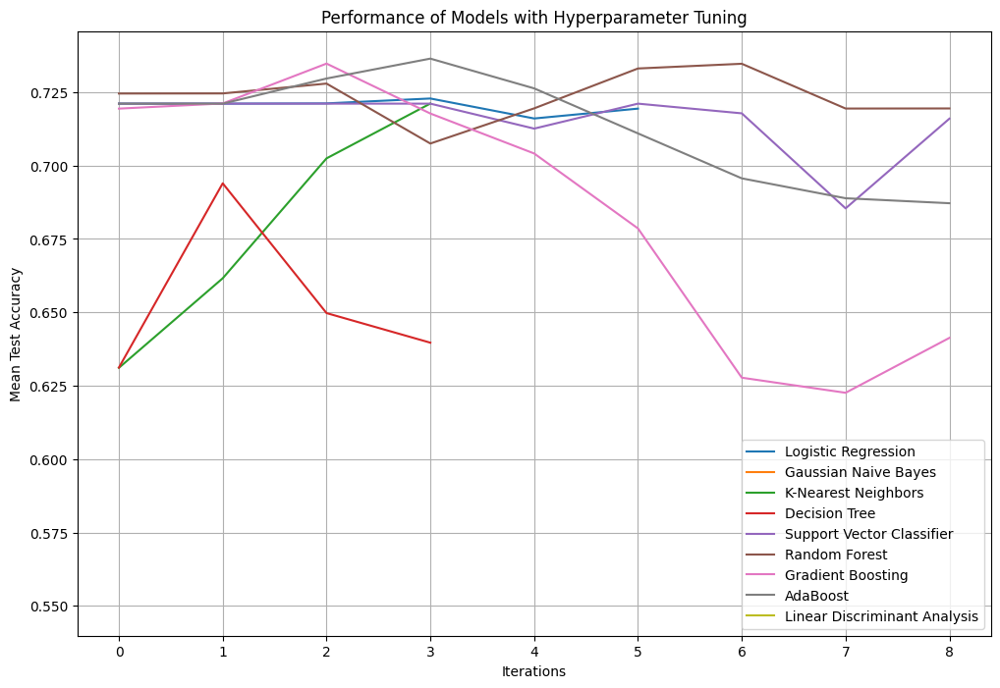

In [176]:
import matplotlib.pyplot as plt

# Plot the performance of each model
plt.figure(figsize=(12, 8))
for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    mean_scores = grid_search.cv_results_['mean_test_score']
    plt.plot(mean_scores, label=name)

plt.title('Performance of Models with Hyperparameter Tuning')
plt.xlabel('Iterations')
plt.ylabel('Mean Test Accuracy')
plt.legend()
plt.grid(True)
plt.show()


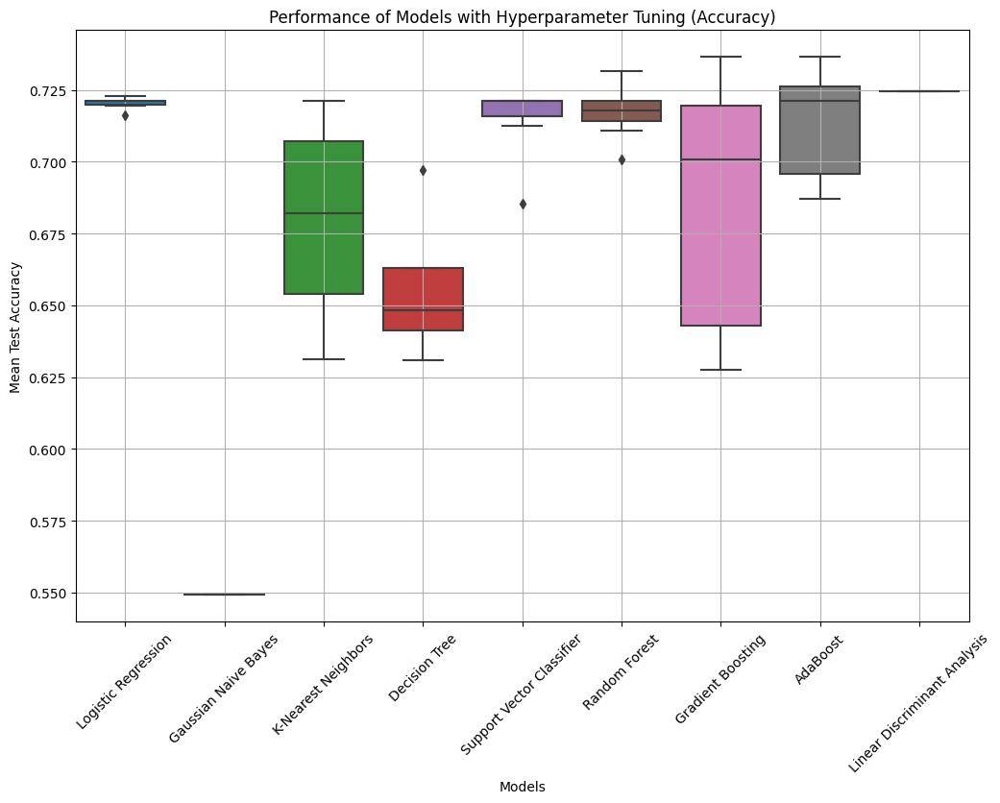

In [177]:
import matplotlib.pyplot as plt
import seaborn as sns

# List to store mean test accuracy for each model
mean_test_accuracy = []

# Loop through each model and perform grid search with cross-validation
for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    mean_test_accuracy.append(grid_search.cv_results_['mean_test_score'])

# Create a box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=mean_test_accuracy)
plt.title('Performance of Models with Hyperparameter Tuning (Accuracy)')
plt.xlabel('Models')
plt.ylabel('Mean Test Accuracy')
plt.xticks(range(len(models_to_tune)), models_to_tune.keys(), rotation=45)
plt.grid(True)
plt.show()


## When F1 is used to choose the best Model after hyper parameter tuning

In [178]:
# Perform grid search for each model
best_models = {}
for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='f1')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_

# Validate performance on the test set
results = {}
for name, model in best_models.items():
    y_pred = model.predict(X_test)
    classification_rep = classification_report(y_test, y_pred)
    results[name] = classification_rep

# Print classification reports for each model on the test set
for name, report in results.items():
    print(f"Classification Report for {name}:\n{report}")

# Final Model Selection based on validation results
best_model_name = max(results, key=lambda key: results[key])
best_model = best_models[best_model_name]
print(f"\nBest Model Selected: {best_model_name}")

Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.83      1.00      0.91       123

    accuracy                           0.83       148
   macro avg       0.42      0.50      0.45       148
weighted avg       0.69      0.83      0.75       148

Classification Report for Gaussian Naive Bayes:
              precision    recall  f1-score   support

           0       0.22      0.76      0.34        25
           1       0.90      0.44      0.59       123

    accuracy                           0.49       148
   macro avg       0.56      0.60      0.46       148
weighted avg       0.78      0.49      0.55       148

Classification Report for K-Nearest Neighbors:
              precision    recall  f1-score   support

           0       0.36      0.20      0.26        25
           1       0.85      0.93      0.89       123

    accuracy                           0

IF ACCURACY IS USED TO CHOOSE THE BEST MODEL

In [183]:
# Perform grid search for each model
best_models = {}
model_scores = {}

for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_
    model_scores[name] = grid_search.best_score_
    
# Sort models based on their scores (from best to worst)
sorted_models = sorted(model_scores.items(), key=lambda x: x[1], reverse=True)

# Print the sorted list of models with their scores
for name, score in sorted_models:
    print(f"{name}: {score}")

# Select the best model
best_model_name = sorted_models[0][0]
best_model = best_models[best_model_name]
print(f"\nBest Model Selected: {best_model_name}")

AdaBoost: 0.7364406779661017
Gradient Boosting: 0.7347457627118644
Random Forest: 0.7296902396259497
Linear Discriminant Analysis: 0.7245470485096436
Logistic Regression: 0.7228521332554061
K-Nearest Neighbors: 0.7211279953243717
Support Vector Classifier: 0.7210987726475746
Decision Tree: 0.6973407364114552
Gaussian Naive Bayes: 0.5491817650496784

Best Model Selected: AdaBoost


IF F1 SCORE IS USED TO  BEST SCORE 

In [185]:
# Perform grid search for each model
best_models = {}
model_scores = {}

for name, (model, param_grid) in models_to_tune.items():
    grid_search = GridSearchCV(model, param_grid, cv=skfold, scoring='f1')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_
    model_scores[name] = grid_search.best_score_
    
# Sort models based on their scores (from best to worst)
sorted_models = sorted(model_scores.items(), key=lambda x: x[1], reverse=True)

# Print the sorted list of models with their scores
for name, score in sorted_models:
    print(f"{name}: {score}")

# Select the best model
best_model_name = sorted_models[0][0]
best_model_f1 = best_models[best_model_name]
print(f"\nBest Model Selected: {best_model_name}")

AdaBoost: 0.8344746390225841
Logistic Regression: 0.8334964438122332
Support Vector Classifier: 0.8332923217133743
Gradient Boosting: 0.8328712690817953
Random Forest: 0.8289514810479671
K-Nearest Neighbors: 0.8166438670675111
Linear Discriminant Analysis: 0.7996802210253018
Decision Tree: 0.759800695473648
Gaussian Naive Bayes: 0.57776308988406

Best Model Selected: AdaBoost


Alternative method to Improving Performnace is Ensemble methods 
Ensemble methods are techniques that combine multiple individual models to improve the overall predictive performance compared to any single model. They work by leveraging the wisdom of the crowd, where the collective decision of multiple models tends to be more accurate and robust than the decision of any individual model. Some popular ensemble methods for improving accuracy include:

Bagging (Bootstrap Aggregating):

Random Forest: Constructs multiple decision trees during training and outputs the mode of the classes as the prediction (classification) or average prediction (regression) of the individual trees.
Bagged Decision Trees: Similar to Random Forest but typically with decision trees as base learners.
Boosting:

AdaBoost (Adaptive Boosting): Iteratively trains weak classifiers (e.g., shallow decision trees) on different subsets of the training data, giving more weight to misclassified samples in subsequent iterations.
Gradient Boosting Machines (GBM): Builds an ensemble of trees sequentially, where each new tree corrects the errors made by the previous ones by fitting residuals.
Stacking (Stacked Generalization):

Stacked Ensemble: Combines the predictions of multiple models (base learners) using a meta-model (often logistic regression or another model) that learns how to best combine the predictions.
Voting:

Voting Classifier: Combines the predictions of multiple base classifiers (e.g., decision trees, SVMs, logistic regression) and predicts the class with the most votes (hard voting) or the class with the highest average probability (soft voting).
Bayesian Model Averaging (BMA):

Bayesian Voting: Instead of using equal weights for all models, assigns different weights to models based on their performance on validation data.

In [ ]:
# 6. Finalize Model
# a) Predictions on validation dataset
# b) Create standalone model on entire training dataset
# c) Save model for later use

PERFROMANCE ON UNSEEN DATA

In [186]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split

# Split the training data into training and validation sets
X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Make predictions on the validation dataset
y_pred_validation = best_model_f1.predict(X_validation)

# Calculate evaluation metrics
accuracy = accuracy_score(y_validation, y_pred_validation)
precision = precision_score(y_validation, y_pred_validation, average='weighted')
recall = recall_score(y_validation, y_pred_validation, average='weighted')
f1 = f1_score(y_validation, y_pred_validation, average='weighted')

# Print evaluation metrics
print(f"Accuracy on validation dataset: {accuracy}")
print(f"Precision on validation dataset: {precision}")
print(f"Recall on validation dataset: {recall}")
print(f"F1-score on validation dataset: {f1}")


Accuracy on validation dataset: 0.7117117117117117
Precision on validation dataset: 0.7955773955773956
Recall on validation dataset: 0.7117117117117117
F1-score on validation dataset: 0.600581808341508


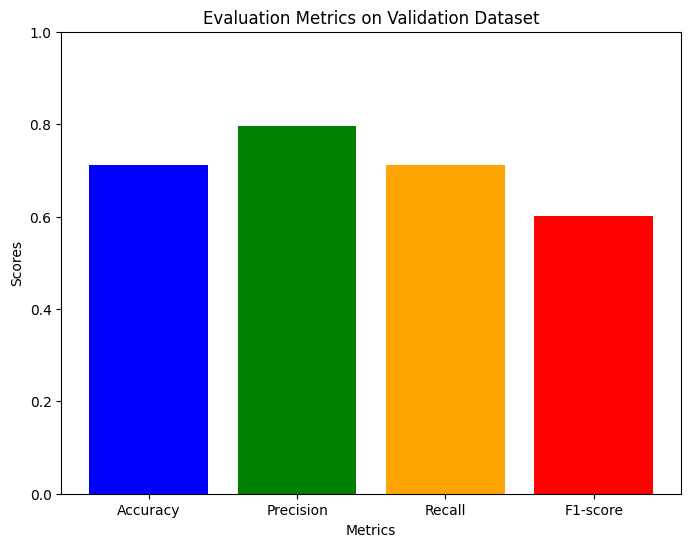

In [188]:
import matplotlib.pyplot as plt

# Evaluation metrics
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-score']
scores = [accuracy, precision, recall, f1]

# Create bar plot
plt.figure(figsize=(8, 6))
plt.bar(metrics, scores, color=['blue', 'green', 'orange', 'red'])
plt.title('Evaluation Metrics on Validation Dataset')
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.ylim(0, 1)  # Set y-axis limit to range between 0 and 1
plt.show()


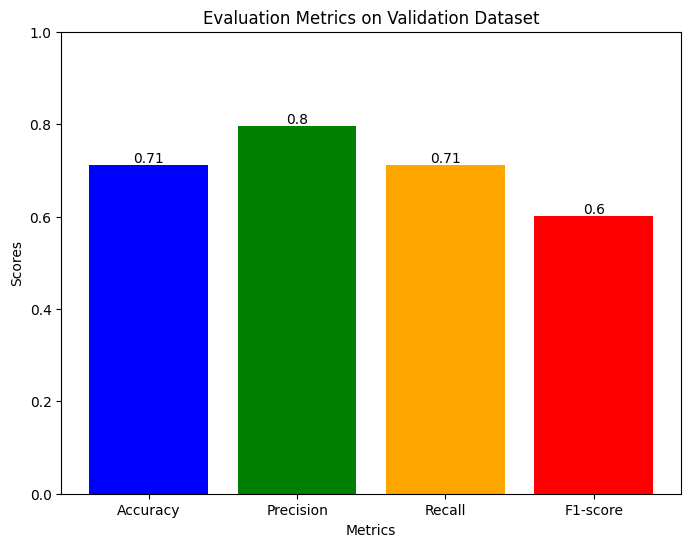

In [189]:
import matplotlib.pyplot as plt

# Evaluation metrics
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-score']
scores = [accuracy, precision, recall, f1]

# Create bar plot
plt.figure(figsize=(8, 6))
bars = plt.bar(metrics, scores, color=['blue', 'green', 'orange', 'red'])
plt.title('Evaluation Metrics on Validation Dataset')
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.ylim(0, 1)  # Set y-axis limit to range between 0 and 1

# Add value labels on top of the bars
for bar, score in zip(bars, scores):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), round(score, 2),
             ha='center', va='bottom')

plt.show()


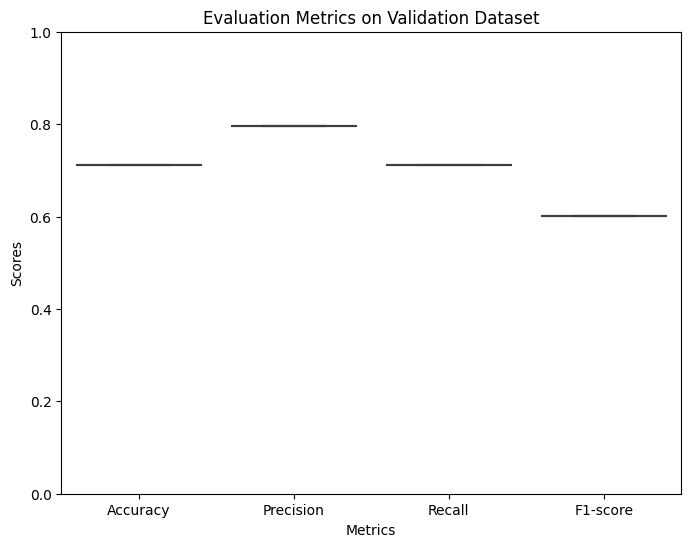

In [190]:
import seaborn as sns
import matplotlib.pyplot as plt

# Combine the scores into a DataFrame
data = {'Metric': metrics, 'Score': scores}
df = pd.DataFrame(data)

# Create a box plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Metric', y='Score', data=df)
plt.title('Evaluation Metrics on Validation Dataset')
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.ylim(0, 1)  # Set y-axis limit to range between 0 and 1
plt.show()


### FEATURE IMPORTANCE 


Feature importance is a technique used to understand which features have the most impact on a model's predictions. It helps in feature selection, model interpretation, identifying data quality issues, and gaining business insights.

Feature Importances:
               Feature  Importance
14     stress_category        0.30
5            weightst1        0.24
3           childeduc1        0.10
17              tlbase        0.10
2            religion1        0.08
4            heightst1        0.06
8              ses_cat        0.04
12         childpremt1        0.04
18                tl12        0.02
16  Viralload_Category        0.02
26   HTTLPRrs35531_new        0.00
25         httlpr1_new        0.00
23          rs34517220        0.00
22           rs1843809        0.00
21           rs1386494        0.00
20           Rs1360780        0.00
19          Rs10482605        0.00
24       stin2vntr_new        0.00
0             agecatak        0.00
15        CD4_category        0.00
1                 sex1        0.00
13          chilborhiv        0.00
11         childworst1        0.00
10          childartk1        0.00
9          livelihood1        0.00
7           orphanhood        0.00
6           childtrib1        0.00

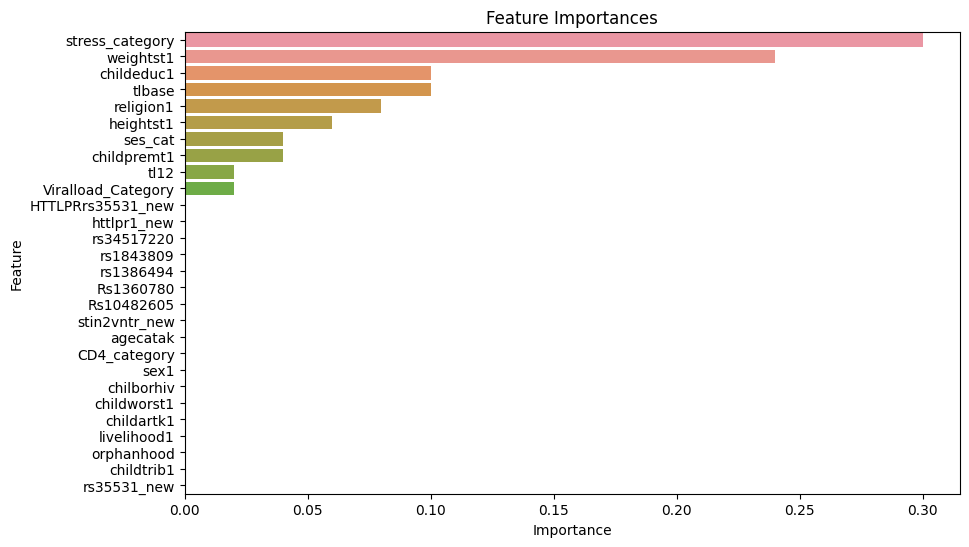

In [187]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_feature_importances(model, features):
    """
    Plot feature importances for the given model.
    
    Parameters:
        model (object): The trained model for which feature importances are to be plotted.
        features (DataFrame): DataFrame containing the features used for training.
    """
    # Check if the model supports feature importances
    if hasattr(model, 'feature_importances_'):
        # Get feature importances
        feature_importances = model.feature_importances_
        
        # Assuming your features are stored in a DataFrame 'features' with column names
        feature_names = features.columns
        
        # Create a DataFrame to display feature importances
        feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
        
        # Sort the DataFrame by importance in descending order
        feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
        
        # Print or visualize the feature importances
        print("Feature Importances:")
        print(feature_importance_df)

                # Plot feature importances
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
        plt.title('Feature Importances')
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.show()
    else:
        print("Feature importances are not available for this model.")

# Assuming 'best_model' is the trained model and 'features' is the DataFrame containing features
plot_feature_importances(best_model, features)